### Visualization analysis for MDH likely-wood-857 sequences with the GPT-2 model

In [1]:
from biosynseq import metrics
from biosynseq import visualize
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from pathlib import Path
from typing import List, Dict

In [2]:
%config InlineBackend.figure_format='retina'
%matplotlib inline
plt.rcParams['figure.figsize'] = [8,6]
plt.rcParams["font.family"] = "sans-serif"
plt.rcParams.update({'font.size':14})

In [3]:
ls /homes/mzvyagin/mdh_gpt2/likely-wood-857

gpt2_mdh_4node_3mer.yaml
likely-wood-857_1024concat_seqs.fasta
likely-wood-857-1024concat_seqs_fasta_embeddings_mean.npy
likely-wood-857-128seqs_without_known_seq_check.fasta
likely-wood-857-128seqs_without_known_seq_check_fasta_embeddings_mean.npy
likely-wood-857-test_fasta_embeddings_mean.npy
likely-wood-857-train_fasta_embeddings_mean.npy
likely-wood-857-val_fasta_embeddings_mean.npy
mdh_gpt2.json
model-epoch72-val_loss0.89.pt


In [4]:
ls /homes/mzvyagin/mdh_gpt2/

earnest-river-122/               test_folder_concatenated.fasta
likely-wood-857/                 train_folder_concatenated.fasta
mdh_gpt2_likely-wood-857.tar.gz  val_folder_concatenated.fasta


# Get t-SNE plots

### Generated Sequences

In [5]:
gen_embed_path = Path("/homes/mzvyagin/mdh_gpt2/likely-wood-857/likely-wood-857-1024concat_seqs_fasta_embeddings_mean.npy")
gen_fasta_path = Path("/homes/mzvyagin/mdh_gpt2/likely-wood-857/likely-wood-857_1024concat_seqs.fasta")
cluster_path = Path("/homes/lind/MDH-pipeline/visualize/")

{'GC':               z0          z1         GC
 0     -25.564785  257.147858  35.382956
 1      57.788120   54.563065  44.867725
 2       9.268736  160.409637  45.846818
 3      81.455345 -173.178207  63.862928
 4      20.529768  224.859406  44.887526
 ...          ...         ...        ...
 1019   83.934517   59.202774  39.139785
 1020 -188.640106  -30.521029  44.883485
 1021  198.608551  -49.267811  63.862928
 1022   -3.423181 -155.920212  38.977636
 1023   19.979279  -15.557702  53.141640
 
 [1024 rows x 3 columns],
 'SequenceLength':               z0          z1  SequenceLength
 0     -25.564785  257.147858             927
 1      57.788120   54.563065             945
 2       9.268736  160.409637             927
 3      81.455345 -173.178207             963
 4      20.529768  224.859406             978
 ...          ...         ...             ...
 1019   83.934517   59.202774             930
 1020 -188.640106  -30.521029             987
 1021  198.608551  -49.267811             

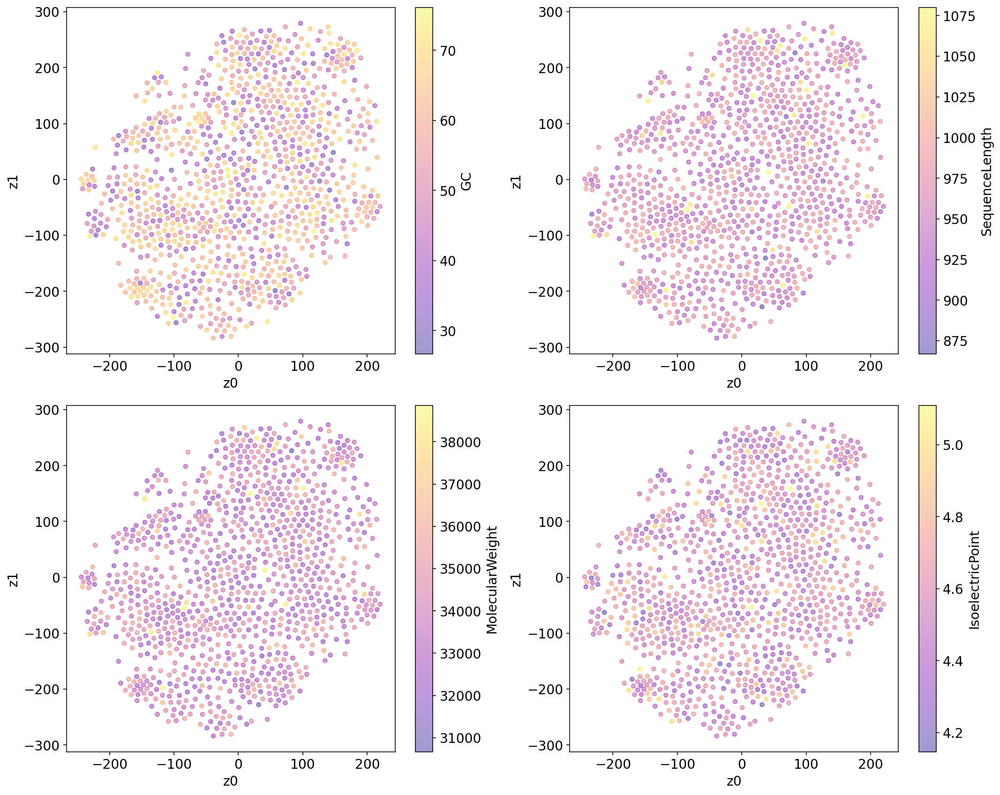

In [6]:
# embed_avg = metrics.get_embed_avg(embed_path=gen_embed_path)
embed_avg = np.load(gen_embed_path)
gen_paint_df = visualize.get_paint_df(fasta_path=gen_fasta_path, embed_path=gen_embed_path)
# if getting all plots as subplots of a collective image, add the argument get_subplots=True
visualize.get_cluster(embed_data=embed_avg, 
                      paint_df=gen_paint_df, 
                      cluster_path = cluster_path, 
                      tsne_umap="tsne", 
                      get_subplots=True)

In [7]:
# key = "GC"
# paint_df[key].hist(log=True)
# plt.title(key)

In [8]:
# key = "SequenceLength"
# paint_df[key].hist(log=True)
# plt.title(key)

In [9]:
# key = "MolecularWeight"
# paint_df[key].hist(log=True)
# plt.title(key)

In [10]:
# key = "IsoelectricPoint"
# paint_df[key].hist(log=True)
# plt.title(key)

### Test Sequences

In [11]:
test_embed_path = Path("/homes/mzvyagin/mdh_gpt2/likely-wood-857/likely-wood-857-test_fasta_embeddings_mean.npy")
test_fasta_path = Path("/homes/mzvyagin/mdh_gpt2/test_folder_concatenated.fasta")
cluster_path = Path("/homes/lind/MDH-pipeline/visualize/")

/homes/lind/.conda/envs/mdhpipeline/lib/python3.9/site-packages/Bio/Seq.py:2979: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  warnings.warn(


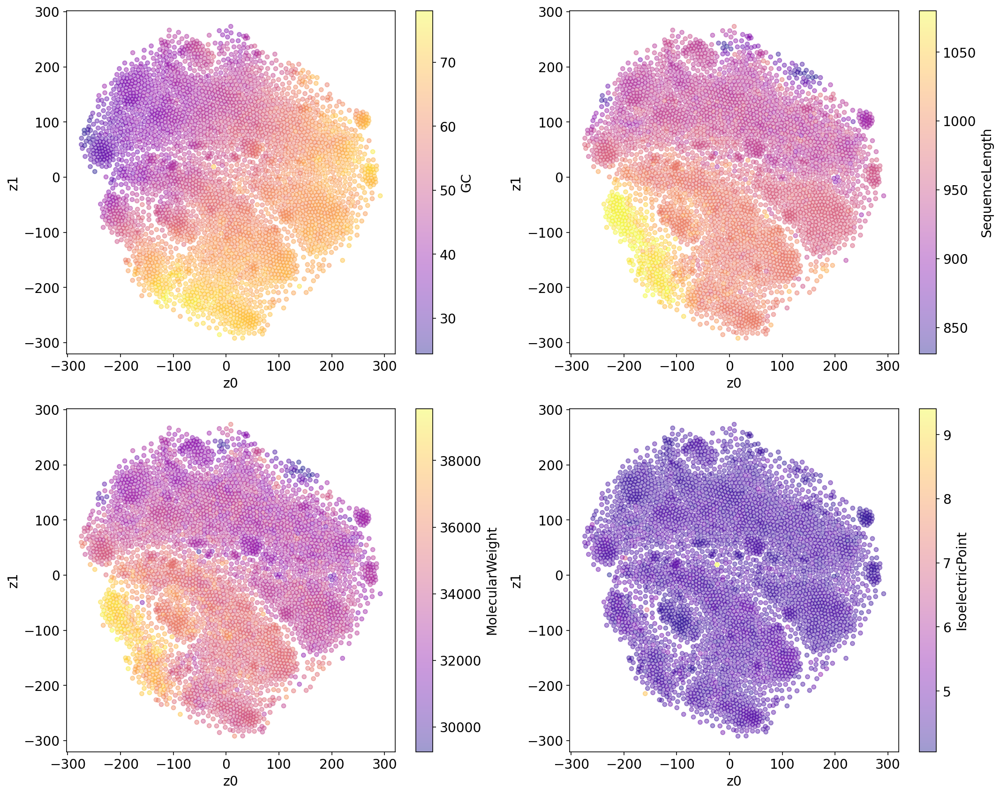

In [12]:
# embed_avg = metrics.get_embed_avg(embed_path=test_embed_path)
embed_avg = np.load(test_embed_path)
test_paint_df = visualize.get_paint_df(fasta_path=test_fasta_path, embed_path=test_embed_path)
# if getting all plots as subplots of a collective image, add the argument get_subplots=True
test_tsne_results = visualize.get_cluster(embed_data=embed_avg, 
                                          paint_df=test_paint_df, 
                                          cluster_path = cluster_path, 
                                          tsne_umap="tsne", 
                                          get_subplots=True)

### Validation Sequences

In [13]:
val_embed_path = Path("/homes/mzvyagin/mdh_gpt2/likely-wood-857/likely-wood-857-val_fasta_embeddings_mean.npy")
val_fasta_path = Path("/homes/mzvyagin/mdh_gpt2/val_folder_concatenated.fasta")
cluster_path = Path("/homes/lind/MDH-pipeline/visualize/")

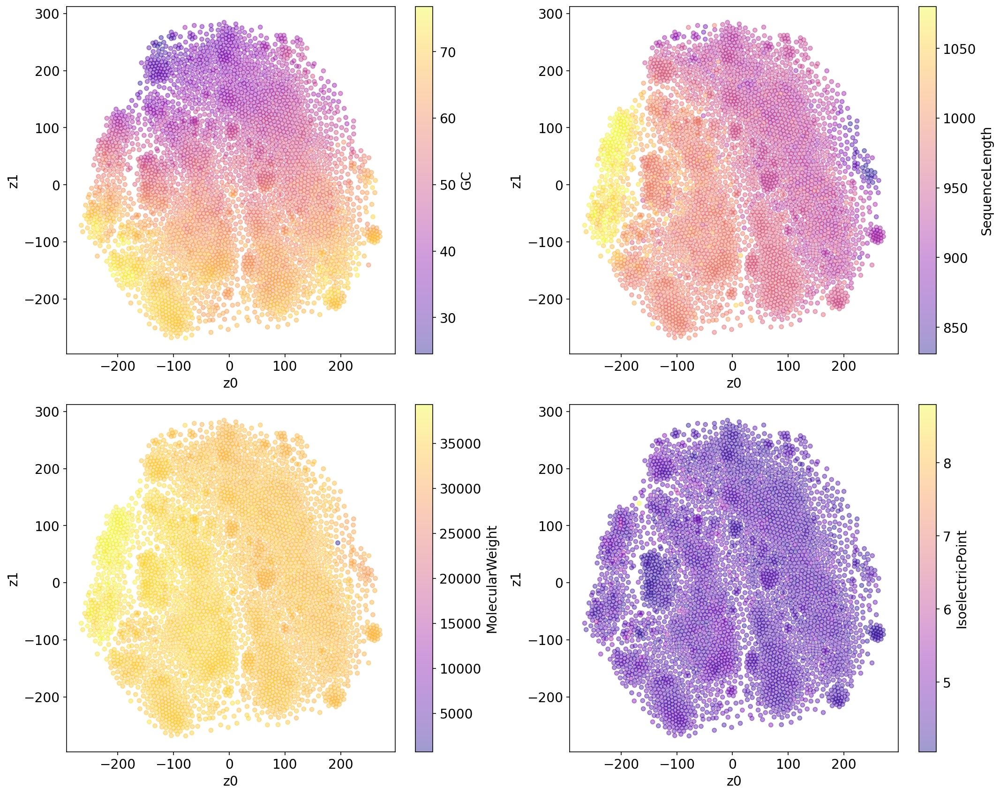

In [14]:
# embed_avg = metrics.get_embed_avg(embed_path=test_embed_path)
embed_avg = np.load(val_embed_path)
val_paint_df = visualize.get_paint_df(fasta_path=val_fasta_path, embed_path=val_embed_path)
# if getting all plots as subplots of a collective image, add the argument get_subplots=True
val_tsne_results = visualize.get_cluster(embed_data=embed_avg, 
                                         paint_df=val_paint_df, 
                                         cluster_path = cluster_path, 
                                         tsne_umap="tsne", 
                                         get_subplots=True)

### Train Sequences

In [15]:
train_embed_path = Path("/homes/mzvyagin/mdh_gpt2/likely-wood-857/likely-wood-857-train_fasta_embeddings_mean.npy")
train_fasta_path = Path("/homes/mzvyagin/mdh_gpt2/train_folder_concatenated.fasta")
cluster_path = Path("/homes/lind/MDH-pipeline/visualize/")

[W] [07:25:18.895545] # of Nearest Neighbors should be at least 3 * perplexity. Your results might be a bit strange...


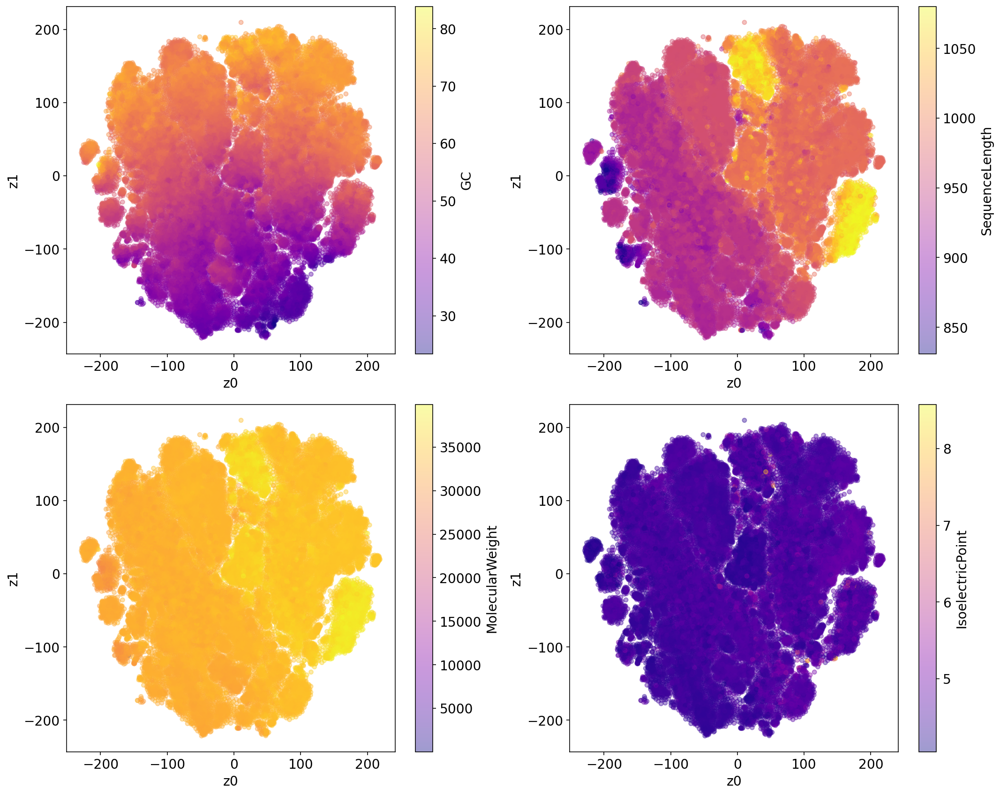

In [16]:
embed_avg = np.load(train_embed_path)
train_paint_df = visualize.get_paint_df(fasta_path=train_fasta_path, embed_path=train_embed_path)
# if getting all plots as subplots of a collective image, add the argument get_subplots=True
val_tsne_results = visualize.get_cluster(embed_data=embed_avg, 
                                         paint_df=train_paint_df, 
                                         cluster_path = cluster_path, 
                                         tsne_umap="tsne", 
                                         get_subplots=True)

'Metrics histogram plot has been saved to ..'

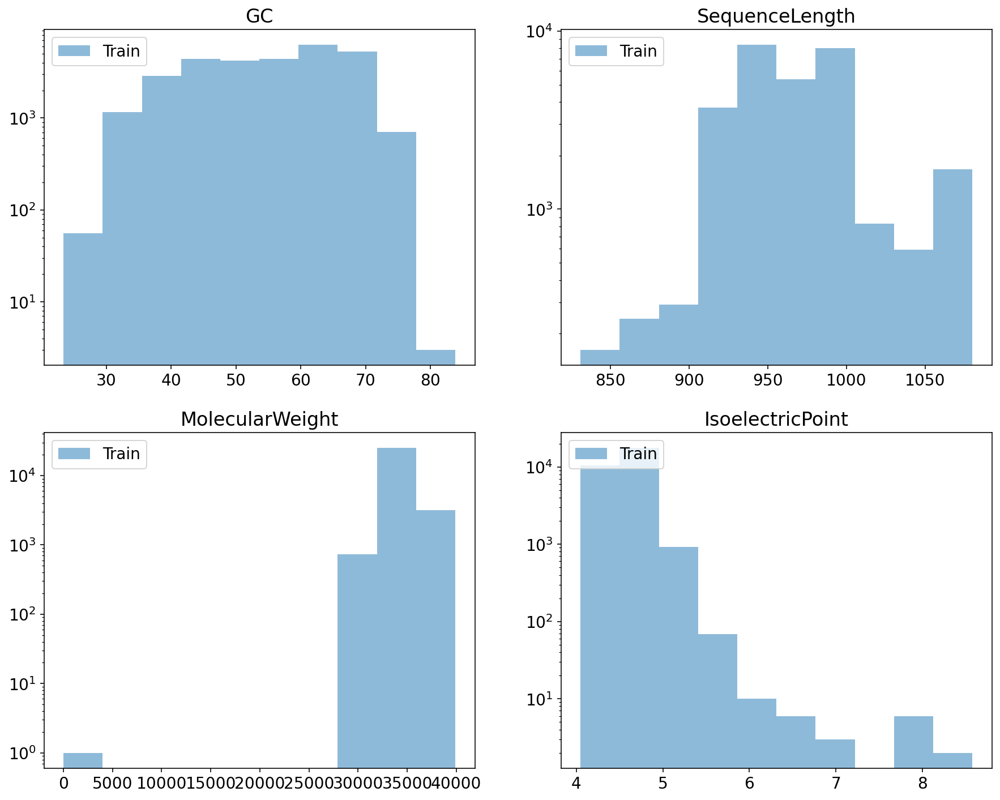

In [17]:
labels = ["Train"]
paint_dfs = [train_paint_df]
visualize.plot_metrics_hist(paint_dfs=paint_dfs, labels=labels)

In [18]:
# def plot_metrics_hist(paint_dfs: List[pd.DataFrame], labels: List[str]) -> None:
#     # function plots the metric values for each type of sequences against each other.
#     # paint_dfs: a list of the paint_df for generated, test, validation, and/or training sequences.
#     # key: the particular metric to plot the histogram with
#     # labels: a list of labels for the functions
#     ncols = 2
#     nrows = round(len(paint_dfs)/2)
#     plt.figure(figsize=(15, 12)) # width, height
    
#     for n, key in enumerate(paint_dfs[0]):
#         plt.subplot(nrows, ncols, n+1)
#         for i in range(len(paint_dfs)):
#             plt.hist(paint_dfs[i][key], alpha=0.5, label=labels[i], log=True) 
#         plt.legend(loc='upper left')
#         plt.title(key)


'Metrics histogram plot has been saved to ..'

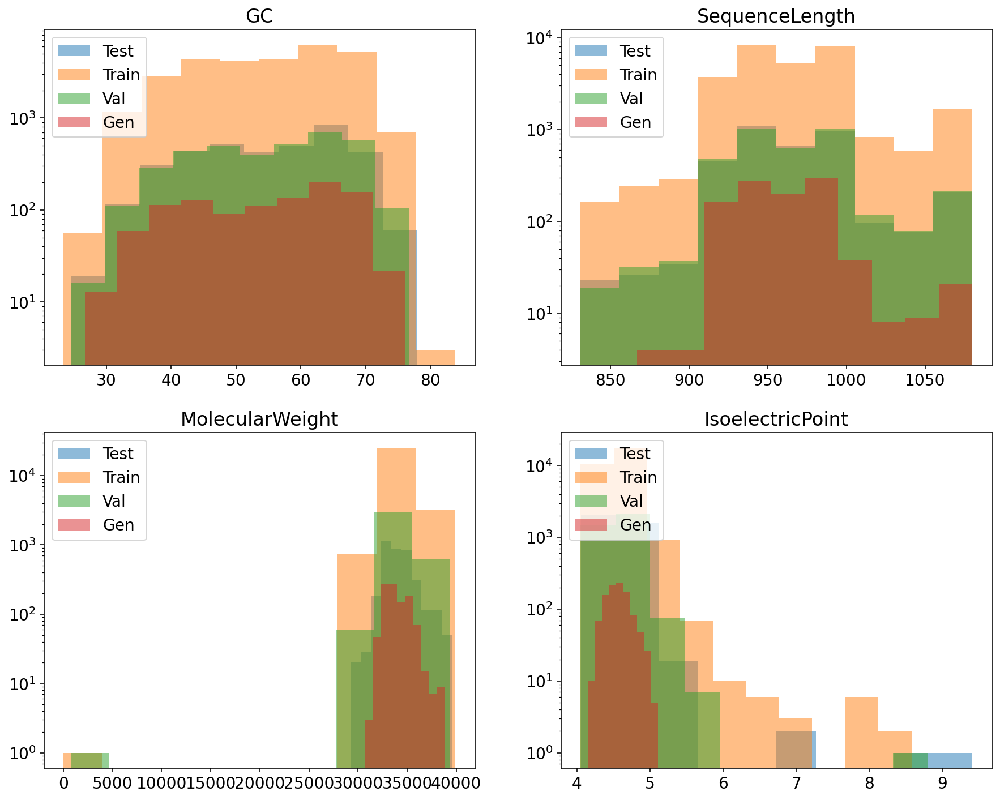

In [19]:
labels = ["Test", "Train", "Val", "Gen"]
paint_dfs = [test_paint_df, train_paint_df, val_paint_df, gen_paint_df]
visualize.plot_metrics_hist(paint_dfs=paint_dfs, labels=labels)

# Get UMAP plots

### Generated Sequences

In [7]:
gen_embed_path = Path("/homes/mzvyagin/mdh_gpt2/likely-wood-857/likely-wood-857-1024concat_seqs_fasta_embeddings_mean.npy")
gen_fasta_path = Path("/homes/mzvyagin/mdh_gpt2/likely-wood-857/likely-wood-857_1024concat_seqs.fasta")
cluster_path = Path("/homes/lind/MDH-pipeline/visualize/")

In [8]:
umap_n_neighbors = 15 # default = 15
umap_min_dist = 0.1 # default = 0.1
umap_spread = 1.0 # default = 1.0
umap_random_state=10 # default = 10

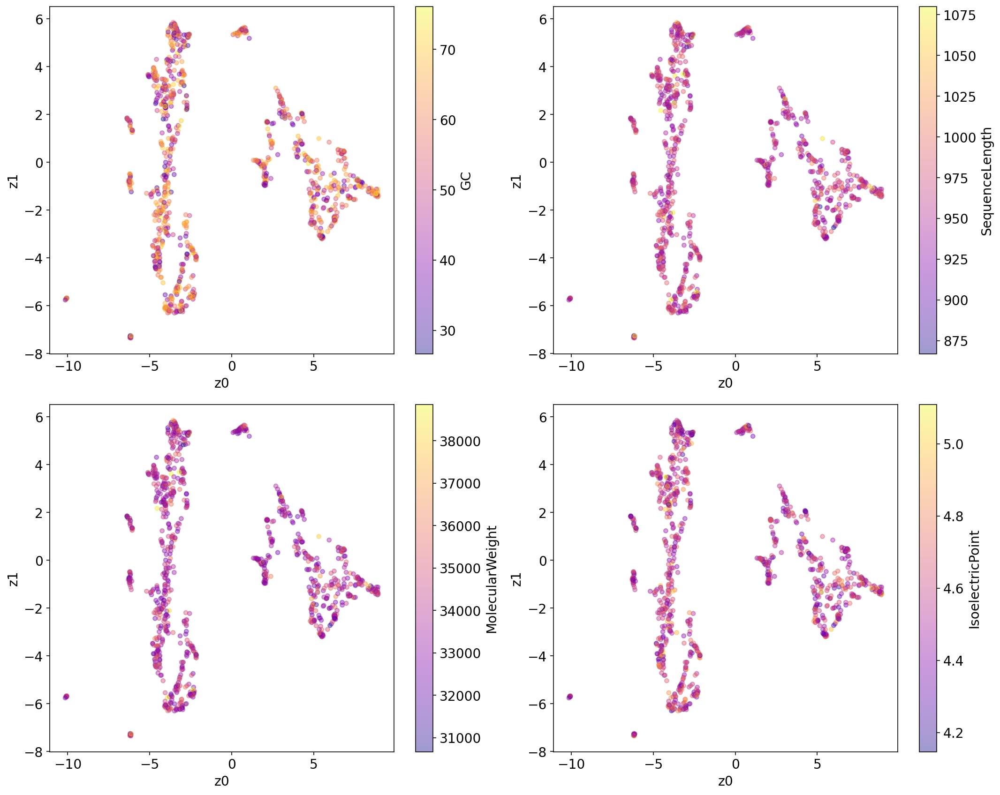

In [9]:
# embed_avg = metrics.get_embed_avg(embed_path=test_embed_path)
embed_avg = np.load(gen_embed_path)
gen_paint_df = visualize.get_paint_df(fasta_path=gen_fasta_path, embed_path=gen_embed_path)
# if getting all plots as subplots of a collective image, add the argument get_subplots=True
test_umap_results = visualize.get_cluster(
    embed_data=embed_avg, 
    paint_df=gen_paint_df, 
    cluster_path = cluster_path, 
    tsne_umap="umap", 
    get_subplots=True, 
    umap_n_neighbors = umap_n_neighbors,
    umap_min_dist = umap_min_dist,
    umap_spread = umap_spread,
    umap_random_state=umap_random_state, 
)

In [24]:
umap_n_neighbors = 10 # default = 15
umap_min_dist = 0.1 # default = 0.1
umap_spread = 1.0 # default = 1.0
umap_random_state=10 # default = 10

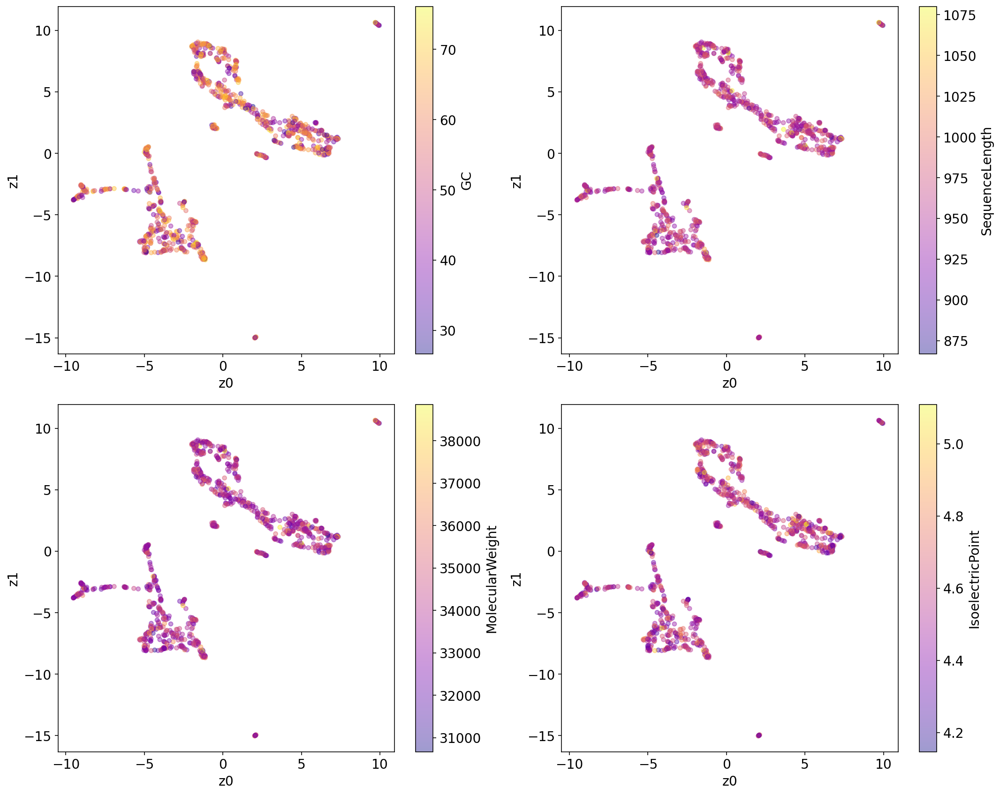

In [25]:
# embed_avg = metrics.get_embed_avg(embed_path=test_embed_path)
embed_avg = np.load(gen_embed_path)
gen_paint_df = visualize.get_paint_df(fasta_path=gen_fasta_path, embed_path=gen_embed_path)
# if getting all plots as subplots of a collective image, add the argument get_subplots=True
test_umap_results = visualize.get_cluster(
    embed_data=embed_avg, 
    paint_df=gen_paint_df, 
    cluster_path = cluster_path, 
    tsne_umap="umap", 
    get_subplots=True, 
    umap_n_neighbors = umap_n_neighbors,
    umap_min_dist = umap_min_dist,
    umap_spread = umap_spread,
    umap_random_state=umap_random_state, 
)

In [24]:
# embed_avg = metrics.get_embed_avg(embed_path=gen_embed_path)
# paint_df = visualize.get_paint_df(fasta_path=gen_fasta_path, embed_path=gen_embed_path)
# # if getting all plots as subplots of a collective image, add the argument get_subplots=True
# visualize.get_cluster(embed_data=embed_avg, paint_df=paint_df, cluster_path = cluster_path, tsne_umap="umap", get_subplots=True)

### Test Sequences

In [20]:
test_embed_path = Path("/homes/mzvyagin/mdh_gpt2/likely-wood-857/likely-wood-857-test_fasta_embeddings_mean.npy")
test_fasta_path = Path("/homes/mzvyagin/mdh_gpt2/test_folder_concatenated.fasta")
cluster_path = Path("/homes/lind/MDH-pipeline/visualize/")

In [21]:
umap_n_neighbors = 15 # default = 15
umap_min_dist = 0.1 # default = 0.1
umap_spread = 1.0 # default = 1.0
umap_random_state=10 # default = 10

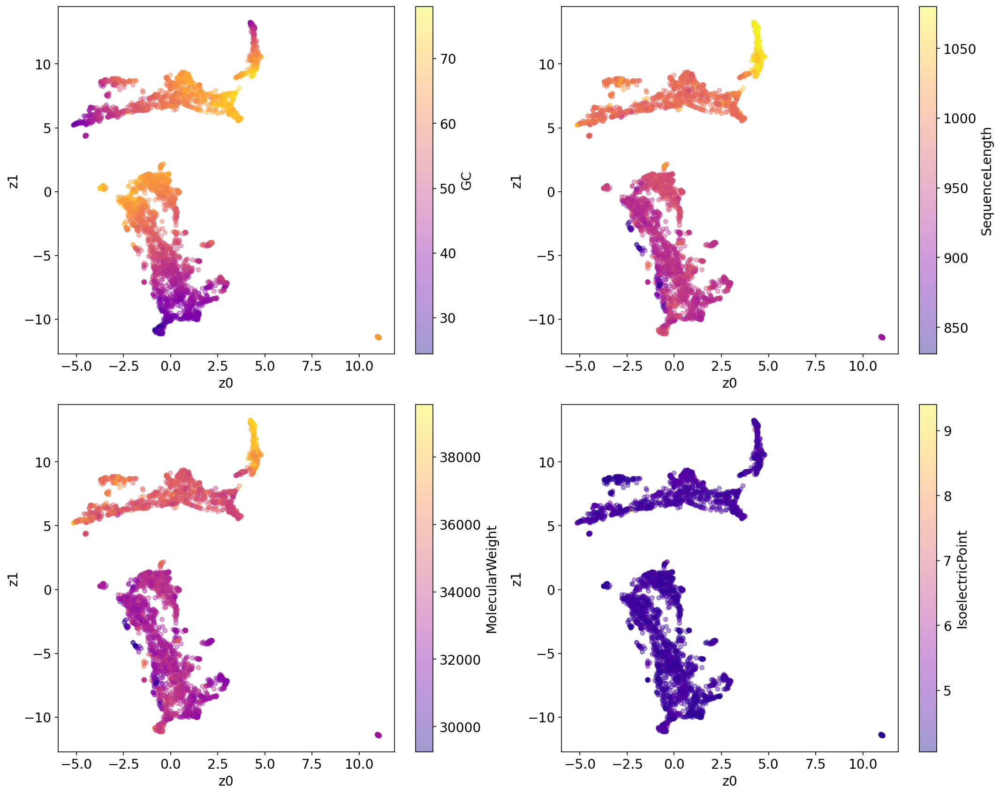

In [22]:
# embed_avg = metrics.get_embed_avg(embed_path=test_embed_path)
embed_avg = np.load(test_embed_path)
paint_df = visualize.get_paint_df(fasta_path=test_fasta_path, embed_path=test_embed_path)
# if getting all plots as subplots of a collective image, add the argument get_subplots=True
test_umap_results = visualize.get_cluster(
    embed_data=embed_avg, 
    paint_df=paint_df, 
    cluster_path = cluster_path, 
    tsne_umap="umap", 
    get_subplots=True, 
    umap_n_neighbors = umap_n_neighbors,
    umap_min_dist = umap_min_dist,
    umap_spread = umap_spread,
    umap_random_state=umap_random_state, 
)

### Validation Sequences

In [23]:
val_embed_path = Path("/homes/mzvyagin/mdh_gpt2/likely-wood-857/likely-wood-857-val_fasta_embeddings_mean.npy")
val_fasta_path = Path("/homes/mzvyagin/mdh_gpt2/val_folder_concatenated.fasta")
cluster_path = Path("/homes/lind/MDH-pipeline/visualize/")

In [24]:
umap_n_neighbors = 100 # default = 15
umap_min_dist = 0.1 # default = 0.1
umap_spread = 1.0 # default = 1.0
umap_random_state=10 # default = 10

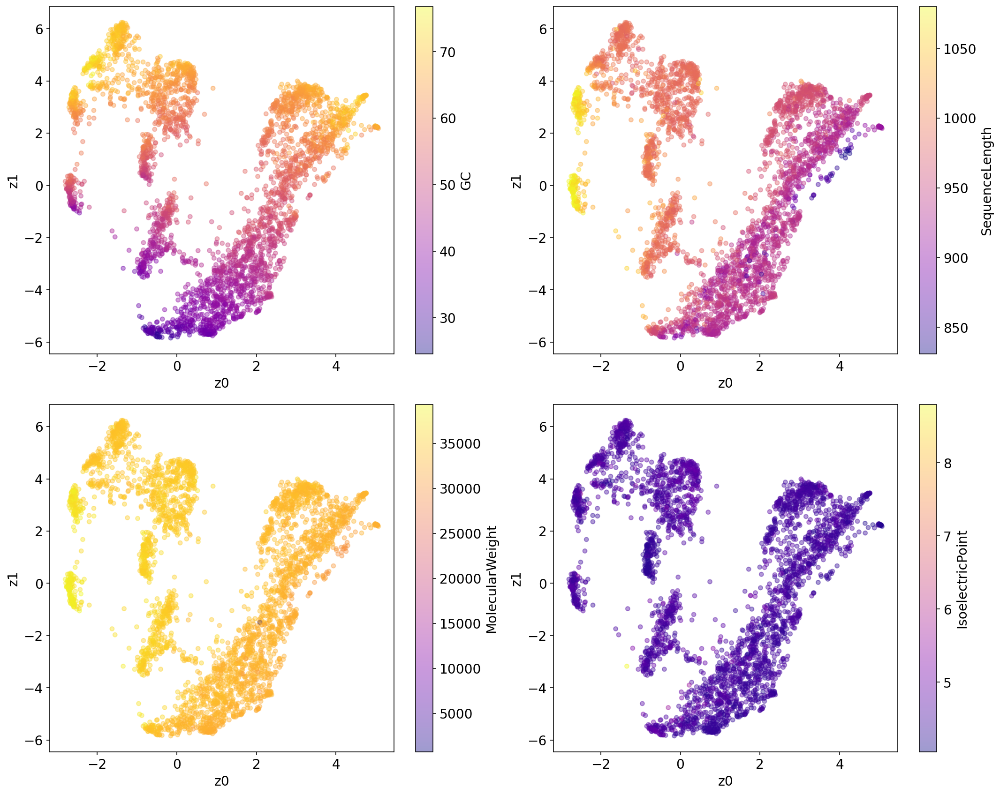

In [25]:
# embed_avg = metrics.get_embed_avg(embed_path=val_embed_path)
embed_avg = np.load(val_embed_path)
paint_df = visualize.get_paint_df(fasta_path=val_fasta_path, embed_path=val_embed_path)
# if getting all plots as subplots of a collective image, add the argument get_subplots=True
val_umap_results = visualize.get_cluster(
    embed_data=embed_avg, 
    paint_df=paint_df, 
    cluster_path = cluster_path, 
    tsne_umap="umap", 
    get_subplots=True, 
    umap_n_neighbors = umap_n_neighbors,
    umap_min_dist = umap_min_dist,
    umap_spread = umap_spread,
    umap_random_state=umap_random_state, 
)

### Train Sequences

In [26]:
train_embed_path = Path("/homes/mzvyagin/mdh_gpt2/likely-wood-857/likely-wood-857-train_fasta_embeddings_mean.npy")
train_fasta_path = Path("/homes/mzvyagin/mdh_gpt2/train_folder_concatenated.fasta")
cluster_path = Path("/homes/lind/MDH-pipeline/visualize/")

In [27]:
umap_n_neighbors = 100 # default = 15
umap_min_dist = 0.1 # default = 0.1
umap_spread = 1.0 # default = 1.0
umap_random_state=10 # default = 10

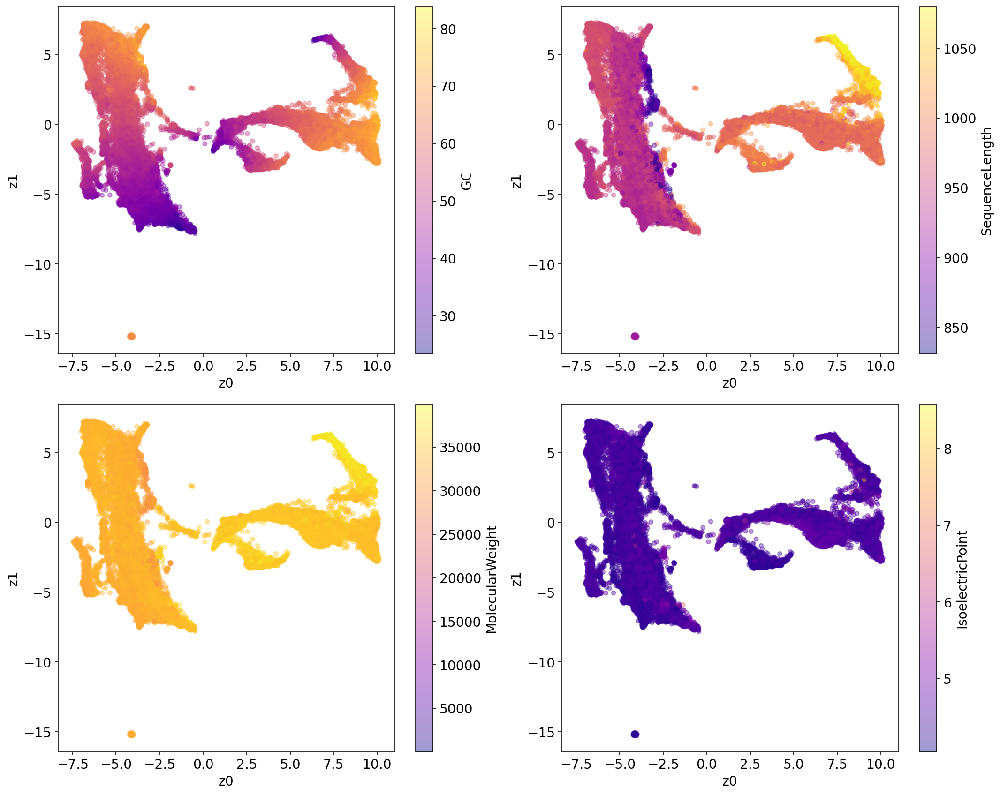

In [28]:
embed_avg = np.load(train_embed_path)
paint_df = visualize.get_paint_df(fasta_path=train_fasta_path, embed_path=train_embed_path)
# if getting all plots as subplots of a collective image, add the argument get_subplots=True
train_umap_results = visualize.get_cluster(
    embed_data=embed_avg, 
    paint_df=paint_df, 
    cluster_path = cluster_path, 
    tsne_umap="umap", 
    get_subplots=True, 
    umap_n_neighbors = umap_n_neighbors,
    umap_min_dist = umap_min_dist,
    umap_spread = umap_spread,
    umap_random_state=umap_random_state, 
)

# Compute alignment scores and plot Alignment Scores vs. Embedding L2 Distance

## Global Alignment

### Generated Sequences

In [5]:
gen_embed_path = Path("/homes/mzvyagin/mdh_gpt2/likely-wood-857/likely-wood-857-1024concat_seqs_fasta_embeddings_mean.npy")
gen_fasta_path = Path("/homes/mzvyagin/mdh_gpt2/likely-wood-857/likely-wood-857_1024concat_seqs.fasta")
align_plot_path = Path("/homes/lind/MDH-pipeline/visualize/")
align_plot_title = "Generated Sequences"
alignment_type = "global"
num_workers = 70
match_score = 1.0
mismatch_score = 0.0
open_gap_score = 0.0
extend_gap_score = 0.0

In [6]:
embed_avg = np.load(gen_embed_path)
dna_seqs = metrics.get_seqs_from_fasta(fasta_path=gen_fasta_path)
protein_seqs = metrics.dna_to_protein_seqs(dna_seqs=dna_seqs)
gen_protein_seqs = metrics.dna_to_protein_seqs(dna_seqs=dna_seqs)

In [14]:
gen_protein_align_scores_matrix = metrics.alignment_scores_parallel(
    seqs1_rec=protein_seqs,
    seqs2_rec=protein_seqs,
    alignment_type=alignment_type,
    num_workers=num_workers,
    match_score=match_score,
    mismatch_score=mismatch_score,
    open_gap_score=open_gap_score,
    extend_gap_score=extend_gap_score,
)

1024it [00:25, 39.69it/s]


In [15]:
gen_scores_df = metrics.get_scores_df(
    embed_avg=embed_avg,
    scores_matrix=gen_protein_align_scores_matrix,
    alignment_type=alignment_type,
)
gen_scores_df.corr()

,Embedding L2 Distance,Global Alignment Score
Embedding L2 Distance,1.00000,-0.00987
Global Alignment Score,-0.00987,1.00000


<AxesSubplot:title={'center':'Generated Sequences'}, xlabel='Global Alignment Score', ylabel='Embedding L2 Distance'>

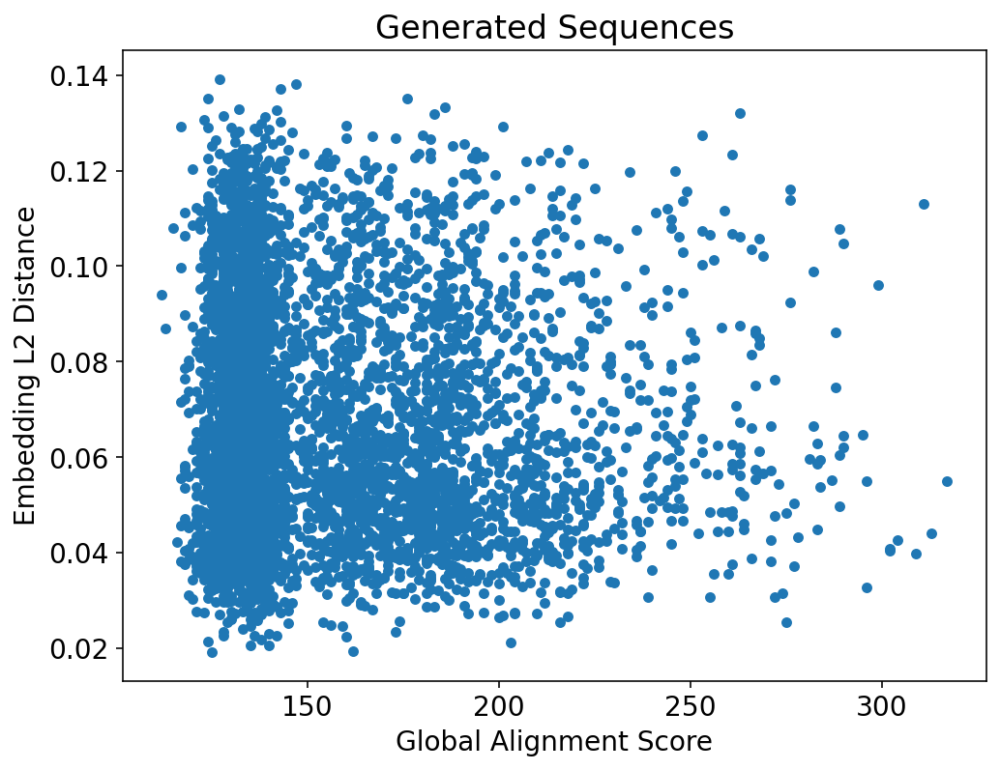

In [16]:
gen_scores_df[::100].plot.scatter(y="Embedding L2 Distance", 
                              x="Global Alignment Score",
                             title="Generated Sequences")

In [17]:
gen_avg_scores_df = metrics.get_avg_scores_df(
    scores_df=gen_scores_df, alignment_type=alignment_type
)
gen_avg_scores_df.corr()

,avg_embed_dist,stdev_embed_dist,Global Alignment Score
avg_embed_dist,1.000000,0.312688,-0.080891
stdev_embed_dist,0.312688,1.000000,-0.039387
Global Alignment Score,-0.080891,-0.039387,1.000000


In [18]:
gen_avg_scores_df

,avg_embed_dist,stdev_embed_dist,Global Alignment Score
0,0.040119,0.000000,102.0
1,0.079492,0.000000,103.0
2,0.065754,0.023288,104.0
3,0.054878,0.030517,105.0
4,0.038924,0.000000,106.0
...,...,...,...
220,0.066483,0.018082,322.0
221,0.055421,0.017582,323.0
222,0.058430,0.018290,324.0
223,0.059849,0.014281,325.0


'Alignment Score vs. Embedding Distance plot has been saved to /homes/lind/MDH-pipeline/visualize.'

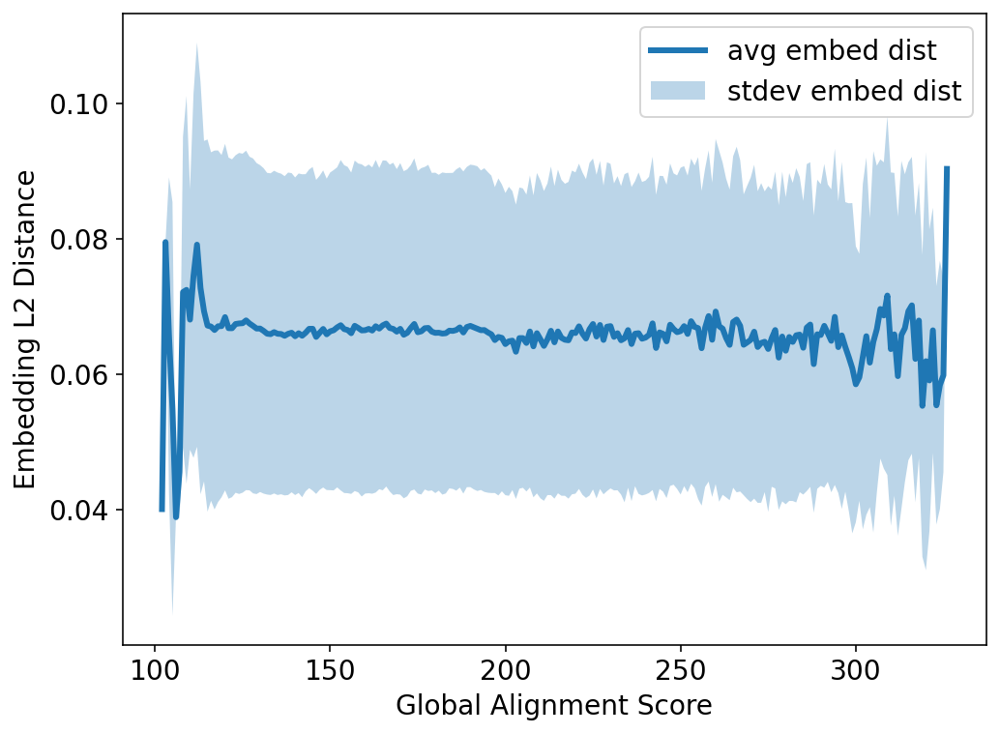

In [19]:
visualize.plot_embed_dist_vs_align_score(
    avg_scores_df=gen_avg_scores_df,
    save_path=align_plot_path,
    alignment_type=alignment_type)

### Test Sequences

In [7]:
test_embed_path = Path("/homes/mzvyagin/mdh_gpt2/likely-wood-857/likely-wood-857-test_fasta_embeddings_mean.npy")
test_fasta_path = Path("/homes/mzvyagin/MDH/gene_transformer/gene_transformer/data/full_mdh_fasta/test.fasta")
align_plot_path = Path("/homes/lind/MDH-pipeline/visualize/")
align_plot_title = "Test Sequences"
alignment_type = "global"
num_workers = 70
match_score = 1.0
mismatch_score = 0.0
open_gap_score = 0.0
extend_gap_score = 0.0

In [8]:
# embed_avg = metrics.get_embed_avg(embed_path=test_embed_path)
embed_avg = np.load(test_embed_path)
dna_seqs = metrics.get_seqs_from_fasta(fasta_path=test_fasta_path)
embed = np.load(test_embed_path)
dna_seqs = dna_seqs[: len(embed)]  # clip DNA sequence to embedding length
test_protein_seqs = metrics.dna_to_protein_seqs(dna_seqs=dna_seqs)

/homes/lind/.conda/envs/mdhpipeline/lib/python3.9/site-packages/Bio/Seq.py:2979: BiopythonWarning: Partial codon, len(sequence) not a multiple of three. Explicitly trim the sequence or add trailing N before translation. This may become an error in future.
  warnings.warn(


In [32]:
# test_protein_align_scores_matrix = metrics.alignment_scores_parallel(
#     seqs1_rec=protein_seqs,
#     seqs2_rec=protein_seqs,
#     alignment_type=alignment_type,
#     num_workers=num_workers,
#     match_score=match_score,
#     mismatch_score=mismatch_score,
#     open_gap_score=open_gap_score,
#     extend_gap_score=extend_gap_score,
# )

In [ ]:
test_scores_df = metrics.get_scores_df(
    embed_avg=embed_avg,
    scores_matrix=test_protein_align_scores_matrix,
    alignment_type=alignment_type,
)
test_scores_df.corr()

In [ ]:
test_scores_df[::100].plot.scatter(y="Embedding L2 Distance", 
                              x="Global Alignment Score",
                             title="Test Sequences")

In [ ]:
test_avg_scores_df = metrics.get_avg_scores_df(
    scores_df=test_scores_df, alignment_type=alignment_type
)
test_avg_scores_df.corr()

In [ ]:
test_avg_scores_df

In [ ]:
visualize.plot_embed_dist_vs_align_score(
    avg_scores_df=test_avg_scores_df,
    save_path=align_plot_path,
    alignment_type=alignment_type)

### Validation Sequences

In [5]:
val_embed_path = Path("/homes/mzvyagin/mdh_reformer/mdh_reformer_val_embeddings.npy")
val_fasta_path = Path("/homes/mzvyagin/MDH/gene_transformer/gene_transformer/data/full_mdh_fasta/val.fasta")
align_plot_path = Path("/homes/lind/MDH-pipeline/visualize/")
align_plot_title = "Validation Sequences"
alignment_type = "global"
num_workers = 70
match_score = 1.0
mismatch_score = 0.0
open_gap_score = 0.0
extend_gap_score = 0.0

In [6]:
ls /homes/mzvyagin/mdh_reformer

mdh_reformer_test_embeddings.npy  morning-glitter-822/
mdh_reformer_val_embeddings.npy


In [ ]:
embed_avg = np.load(val_embed_path)

In [ ]:
embed_avg = np.load(Path("/homes/mzvyagin/mdh_reformer/mdh_reformer_val_embeddings.npy"))

In [ ]:
# embed_avg = metrics.get_embed_avg(embed_path=val_embed_path)
embed_avg = np.load(val_embed_path)
print("1")
dna_seqs = metrics.get_seqs_from_fasta(fasta_path=val_fasta_path)
print("2")
embed = np.load(val_embed_path)
print("3")
dna_seqs = dna_seqs[: len(embed)]  # clip DNA sequence to embedding length
print("4")
protein_seqs = metrics.dna_to_protein_seqs(dna_seqs=dna_seqs)
print("5")
val_protein_seqs = metrics.dna_to_protein_seqs(dna_seqs=dna_seqs)

In [23]:
val_protein_align_scores_matrix = metrics.alignment_scores_parallel(
    seqs1_rec=protein_seqs,
    seqs2_rec=protein_seqs,
    alignment_type=alignment_type,
    num_workers=num_workers,
    match_score=match_score,
    mismatch_score=mismatch_score,
    open_gap_score=open_gap_score,
    extend_gap_score=extend_gap_score,
)

3584it [04:26, 13.45it/s]


In [24]:
val_scores_df = metrics.get_scores_df(
    embed_avg=embed_avg,
    scores_matrix=val_protein_align_scores_matrix,
    alignment_type=alignment_type,
)
val_scores_df.corr()

,Embedding L2 Distance,Global Alignment Score
Embedding L2 Distance,1.000000,-0.193602
Global Alignment Score,-0.193602,1.000000


<AxesSubplot:title={'center':'Validation Sequences'}, xlabel='Global Alignment Score', ylabel='Embedding L2 Distance'>

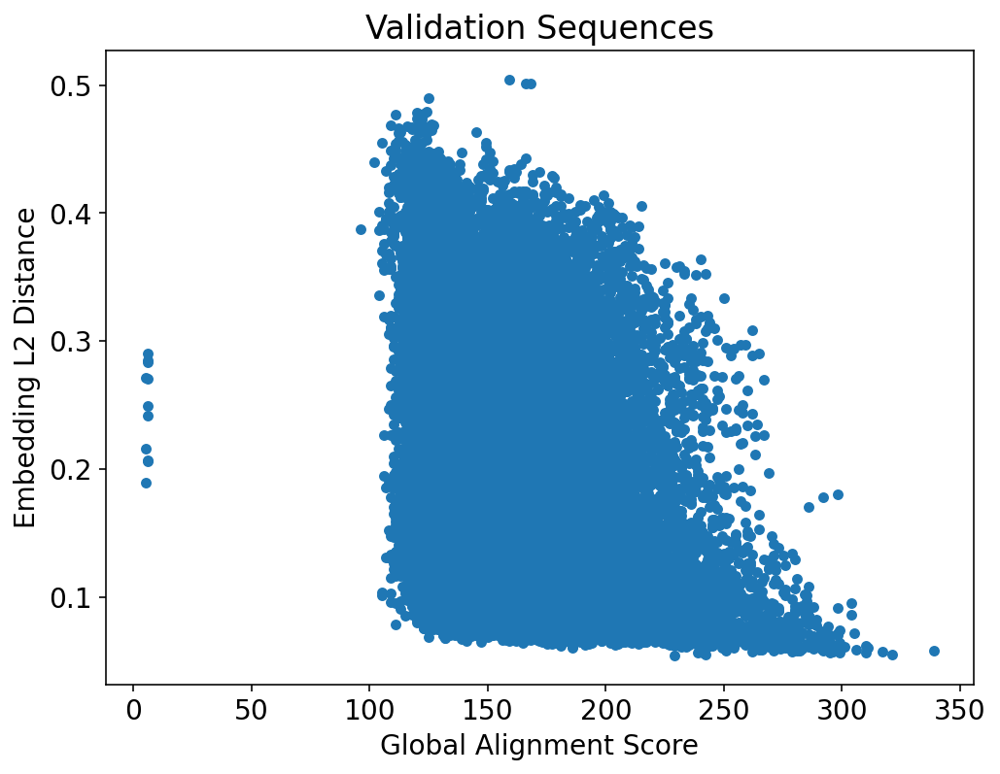

In [25]:
val_scores_df[::100].plot.scatter(y="Embedding L2 Distance", 
                              x="Global Alignment Score", 
                              title="Validation Sequences")

In [26]:
val_avg_scores_df = metrics.get_avg_scores_df(
    scores_df=val_scores_df, alignment_type=alignment_type
)
val_avg_scores_df.corr()

,avg_embed_dist,stdev_embed_dist,Global Alignment Score
avg_embed_dist,1.000000,0.641847,-0.899082
stdev_embed_dist,0.641847,1.000000,-0.766330
Global Alignment Score,-0.899082,-0.766330,1.000000


'Alignment Score vs. Embedding Distance plot has been saved to /homes/lind/MDH-pipeline/visualize.'

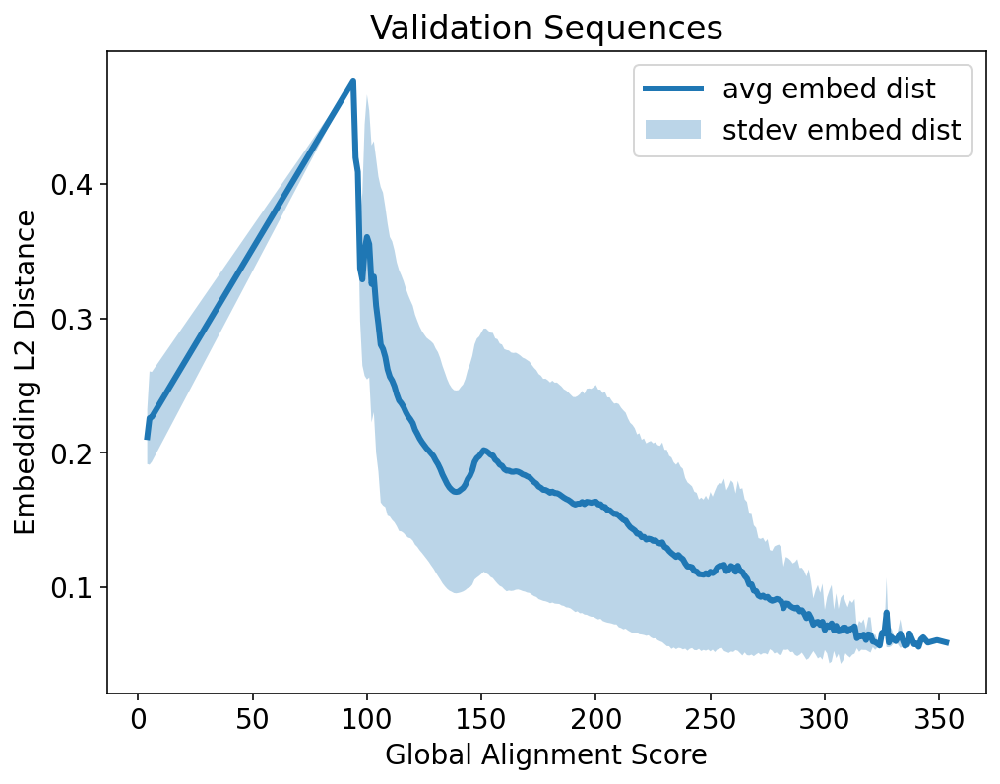

In [27]:
visualize.plot_embed_dist_vs_align_score(
    avg_scores_df=val_avg_scores_df,
    save_path=align_plot_path,
    alignment_type=alignment_type,
    plot_title=align_plot_title
)

# Compute global alignment scores between generated sequences and val/test sequences

### gen vs val sequences

In [ ]:
gen_val_align_scores_matrix = metrics.alignment_scores_parallel(
    seqs1_rec=gen_protein_seqs,
    seqs2_rec=val_protein_seqs,
    alignment_type=alignment_type,
    num_workers=num_workers,
    match_score=match_score,
    mismatch_score=mismatch_score,
    open_gap_score=open_gap_score,
    extend_gap_score=extend_gap_score,
)

In [ ]:
gen_val_align_scores_matrix

In [ ]:
gen_val_align_scores_matrix.shape

In [ ]:
max_gen_val_align_scores_matrix = np.amax(gen_val_align_scores_matrix, axis=1)
print(max_gen_val_align_scores_matrix)
print(max_gen_val_align_scores_matrix.shape)

In [ ]:
min_gen_val_align_scores_matrix = np.amin(gen_val_align_scores_matrix, axis=1)
print(min_gen_val_align_scores_matrix)
print(min_gen_val_align_scores_matrix.shape)

In [ ]:
mean_gen_val_align_scores_matrix = np.mean(gen_val_align_scores_matrix, axis=1)
print(mean_gen_val_align_scores_matrix)
print(mean_gen_val_align_scores_matrix.shape)

In [ ]:
std_gen_val_align_scores_matrix = np.std(gen_val_align_scores_matrix, axis=1)
print(std_gen_val_align_scores_matrix)
print(std_gen_val_align_scores_matrix.shape)

### gen vs test sequences

In [ ]:
gen_test_align_scores_matrix = metrics.alignment_scores_parallel(
    seqs1_rec=gen_protein_seqs,
    seqs2_rec=test_protein_seqs,
    alignment_type=alignment_type,
    num_workers=num_workers,
    match_score=match_score,
    mismatch_score=mismatch_score,
    open_gap_score=open_gap_score,
    extend_gap_score=extend_gap_score,
)

In [ ]:
gen_test_align_scores_matrix

In [ ]:
gen_test_align_scores_matrix.shape

In [ ]:
max_gen_test_align_scores_matrix = np.amax(gen_test_align_scores_matrix, axis=1)
print(max_gen_test_align_scores_matrix)
print(max_gen_test_align_scores_matrix.shape)

In [ ]:
min_gen_test_align_scores_matrix = np.amin(gen_test_align_scores_matrix, axis=1)
print(min_gen_test_align_scores_matrix)
print(min_gen_test_align_scores_matrix.shape)

In [ ]:
mean_gen_test_align_scores_matrix = np.mean(gen_test_align_scores_matrix, axis=1)
print(mean_gen_test_align_scores_matrix)
print(mean_gen_test_align_scores_matrix.shape)

In [ ]:
std_gen_test_align_scores_matrix = np.std(gen_test_align_scores_matrix, axis=1)
print(std_gen_test_align_scores_matrix)
print(std_gen_test_align_scores_matrix.shape)

### Plot global alignment scores between gen vs. val/test sequences

In [18]:
xvals = np.arange(1, 1025, 1)
print(xvals)

[   1    2    3 ... 1022 1023 1024]


#### gen vs val sequences

Text(0.5, 1.0, 'Global Alignment Scores Between Generated and Validation Sequences')

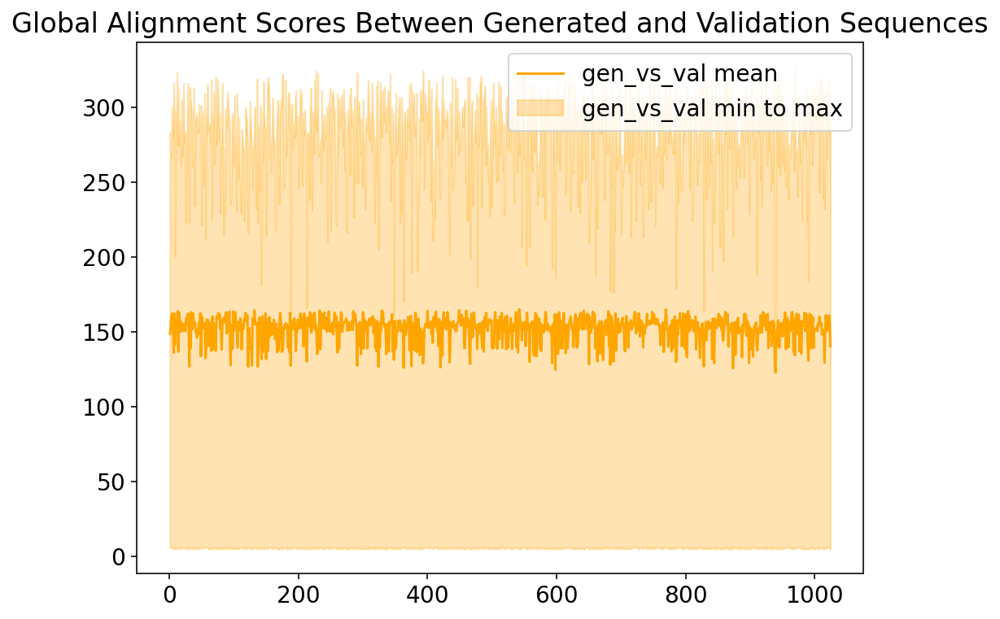

In [19]:
plt.plot(xvals, mean_gen_val_align_scores_matrix, label="gen_vs_val mean", color="orange")
plt.fill_between(xvals, min_gen_val_align_scores_matrix, max_gen_val_align_scores_matrix, alpha=0.3, color="orange", label="gen_vs_val min to max")
plt.legend()
plt.title("Global Alignment Scores Between Generated and Validation Sequences")

Text(0.5, 1.0, 'Global Alignment Scores Between Generated and Validation Sequences')

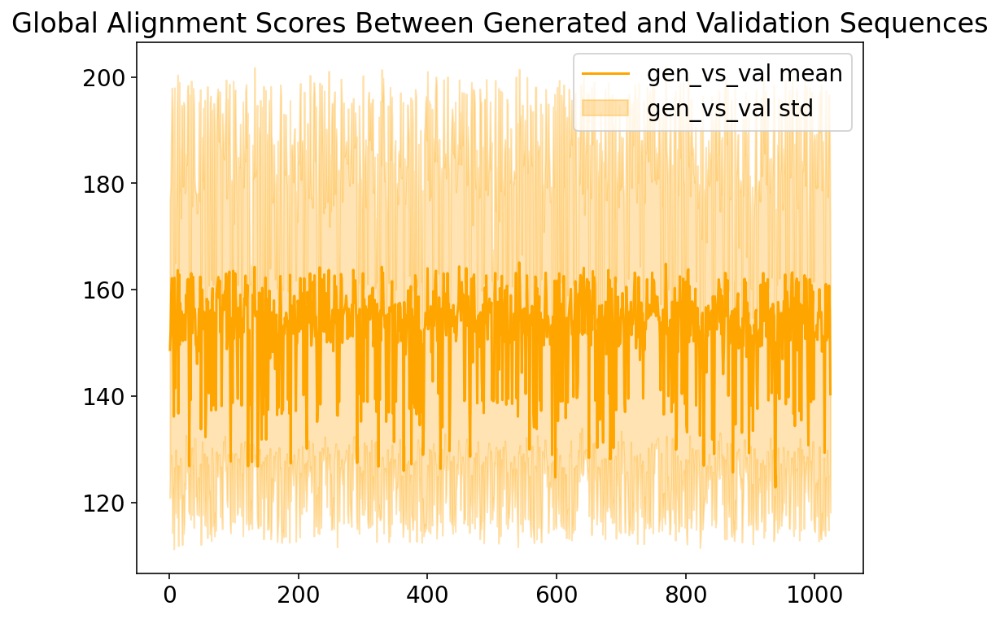

In [20]:
plt.plot(xvals, mean_gen_val_align_scores_matrix, label="gen_vs_val mean", color="orange")
plt.fill_between(xvals, mean_gen_val_align_scores_matrix-std_gen_val_align_scores_matrix, mean_gen_val_align_scores_matrix+std_gen_val_align_scores_matrix, alpha=0.3, color="orange", label="gen_vs_val std")
plt.legend()
plt.title("Global Alignment Scores Between Generated and Validation Sequences")

Text(0.5, 1.0, 'Histogram of Global Alignment Scores between Generated Sequences and Validation Sequences')

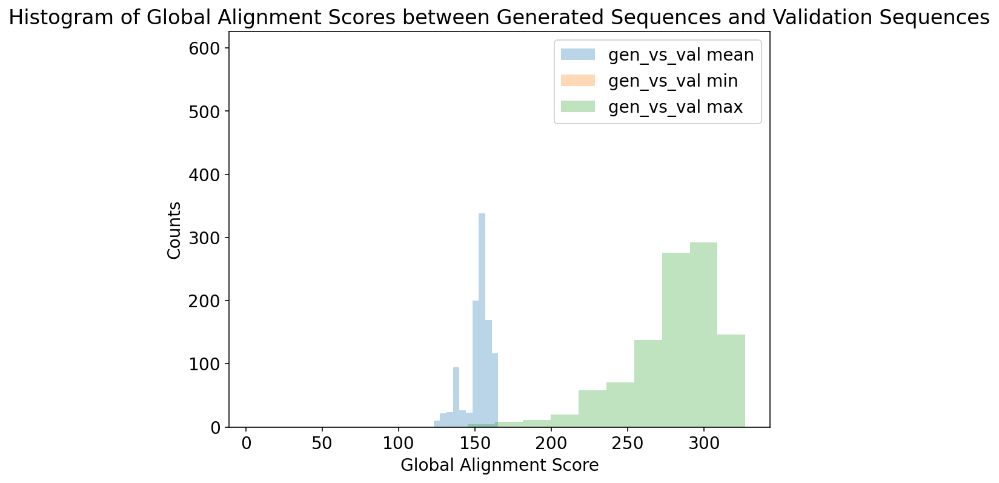

In [37]:
plt.hist(mean_gen_val_align_scores_matrix, alpha=0.3, label="gen_vs_val mean")
plt.hist(min_gen_val_align_scores_matrix, alpha=0.3, label="gen_vs_val min")
plt.hist(max_gen_val_align_scores_matrix, alpha=0.3, label="gen_vs_val max")
plt.xlabel("Global Alignment Score")
plt.ylabel("Counts")
plt.legend() # loc="upper left")
plt.title("Histogram of Global Alignment Scores between Generated Sequences and Validation Sequences")

Text(0.5, 1.0, 'Histogram of Global Alignment Scores between Generated Sequences and Validation Sequences')

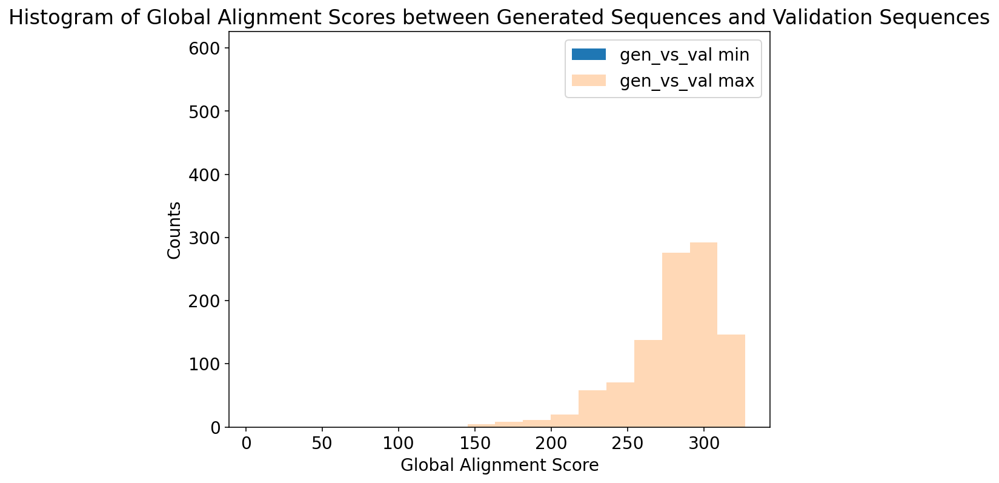

In [44]:
# plt.hist(mean_gen_val_align_scores_matrix, alpha=0.3, label="gen_vs_val mean")
plt.hist(min_gen_val_align_scores_matrix, alpha=1, label="gen_vs_val min")
plt.hist(max_gen_val_align_scores_matrix, alpha=0.3, label="gen_vs_val max")
plt.xlabel("Global Alignment Score")
plt.ylabel("Counts")
plt.legend() # loc="upper left")
plt.title("Histogram of Global Alignment Scores between Generated Sequences and Validation Sequences")

Text(0.5, 1.0, 'Histogram of Global Alignment Scores between Generated Sequences and Validation Sequences')

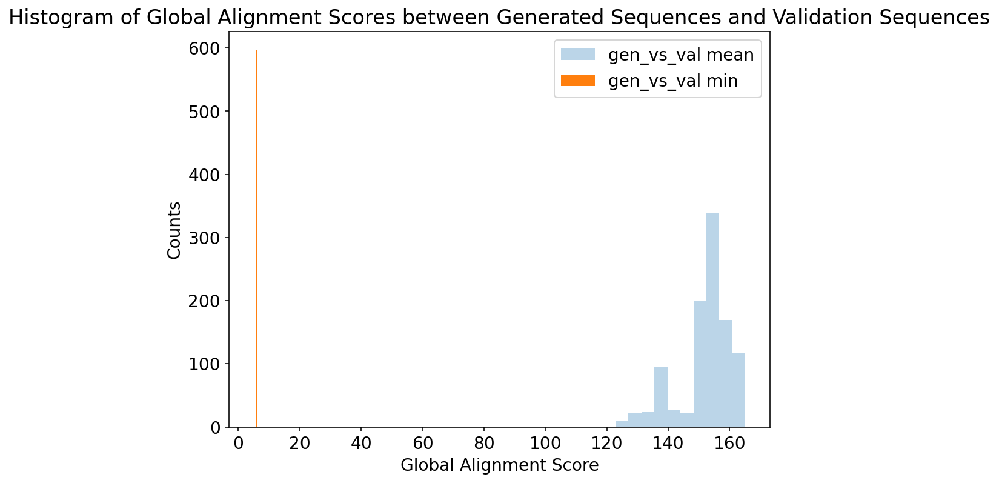

In [45]:
plt.hist(mean_gen_val_align_scores_matrix, alpha=0.3, label="gen_vs_val mean")
plt.hist(min_gen_val_align_scores_matrix, alpha=1, label="gen_vs_val min")
# plt.hist(max_gen_val_align_scores_matrix, alpha=0.3, label="gen_vs_val max")
plt.xlabel("Global Alignment Score")
plt.ylabel("Counts")
plt.legend() # loc="upper left")
plt.title("Histogram of Global Alignment Scores between Generated Sequences and Validation Sequences")

Text(0.5, 1.0, 'Histogram of Global Alignment Scores between Generated Sequences and Validation Sequences')

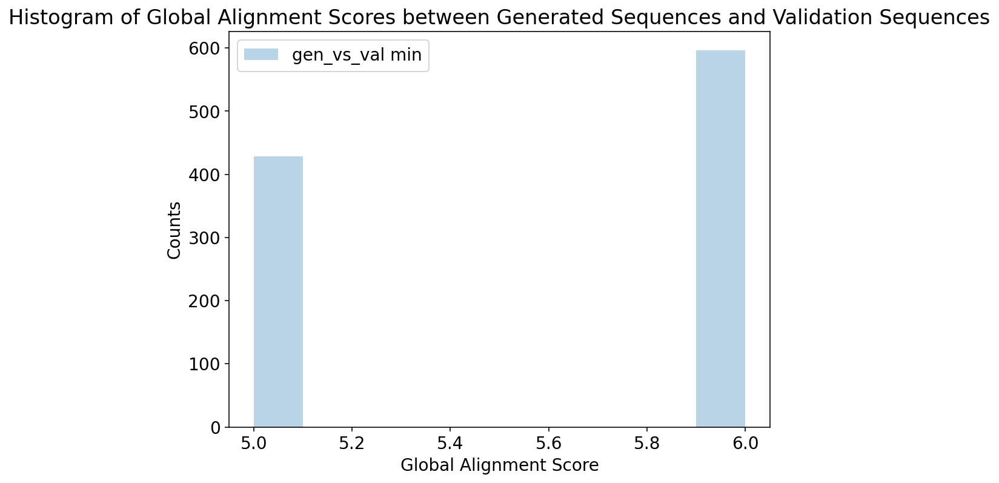

In [32]:
plt.hist(min_gen_val_align_scores_matrix, alpha=0.3, label="gen_vs_val min")
plt.xlabel("Global Alignment Score")
plt.ylabel("Counts")
plt.legend() # loc="upper left")
plt.title("Histogram of Global Alignment Scores between Generated Sequences and Validation Sequences")

#### gen vs test sequences

Text(0.5, 1.0, 'Global Alignment Scores Between Generated and Test Sequences')

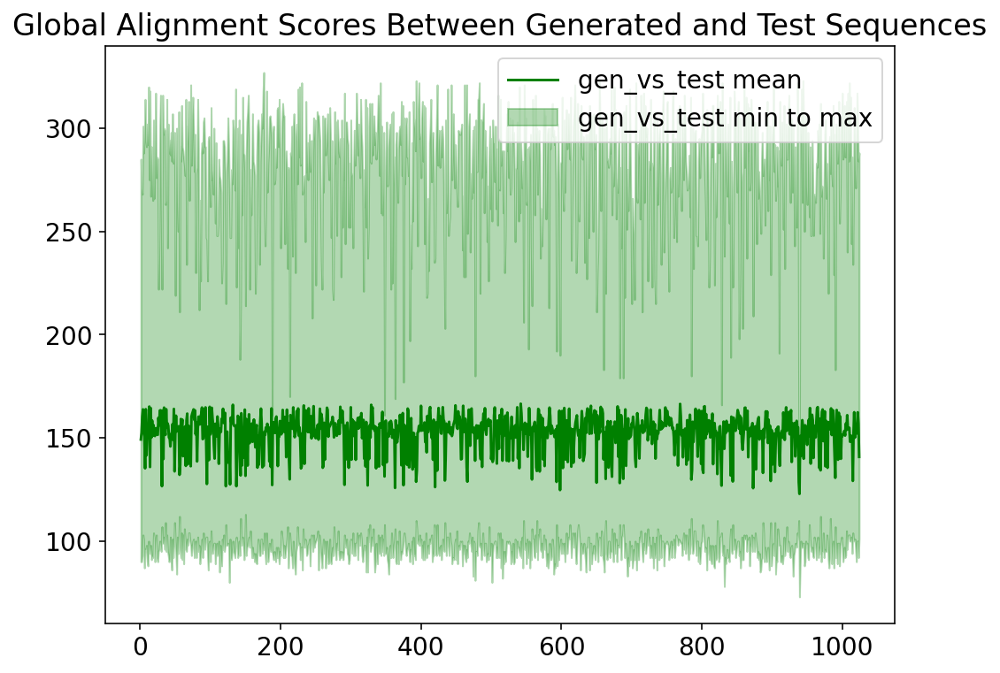

In [29]:
plt.plot(xvals, mean_gen_test_align_scores_matrix, label="gen_vs_test mean", color="green")
plt.fill_between(xvals, min_gen_test_align_scores_matrix, max_gen_test_align_scores_matrix, alpha=0.3, color="green", label="gen_vs_test min to max")
plt.legend()
plt.title("Global Alignment Scores Between Generated and Test Sequences")

Text(0.5, 1.0, 'Global Alignment Scores Between Generated and Test Sequences')

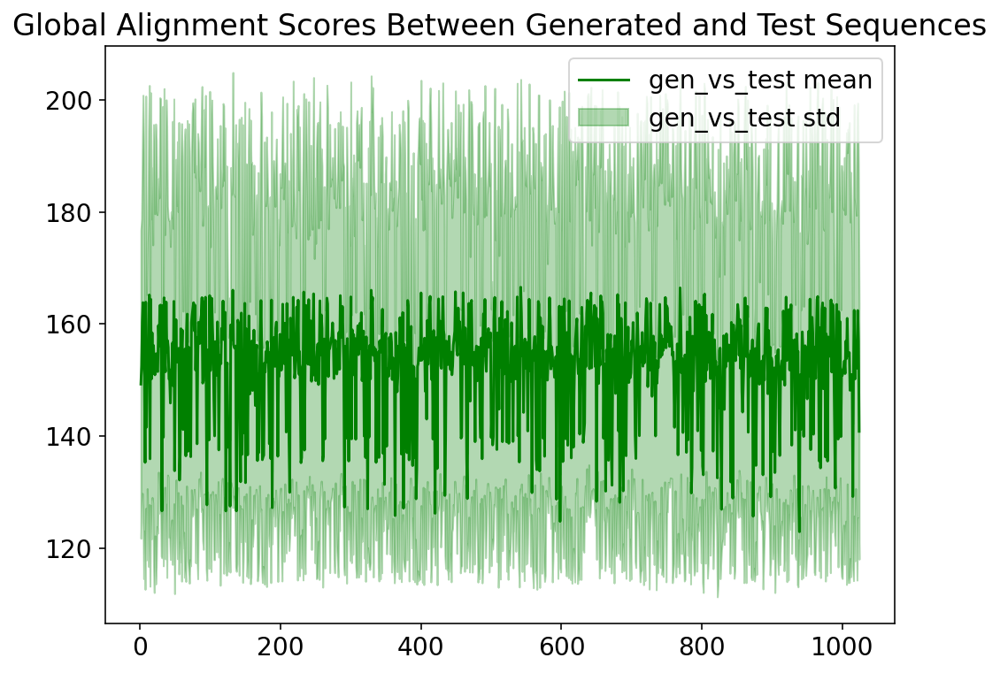

In [30]:
plt.plot(xvals, mean_gen_test_align_scores_matrix, label="gen_vs_test mean", color="green")
plt.fill_between(xvals, mean_gen_test_align_scores_matrix-std_gen_test_align_scores_matrix, mean_gen_test_align_scores_matrix+std_gen_test_align_scores_matrix, alpha=0.3, color="green", label="gen_vs_test std")
plt.legend()
plt.title("Global Alignment Scores Between Generated and Test Sequences")

Text(0.5, 1.0, 'Histogram of Global Alignment Scores between Generated Sequences and Test Sequences')

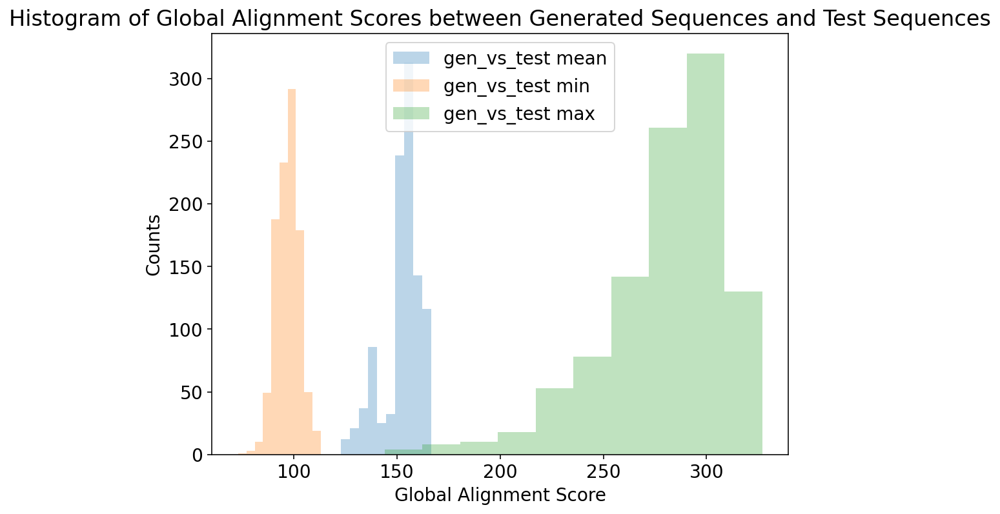

In [31]:
plt.hist(mean_gen_test_align_scores_matrix, alpha=0.3, label="gen_vs_test mean")
plt.hist(min_gen_test_align_scores_matrix, alpha=0.3, label="gen_vs_test min")
plt.hist(max_gen_test_align_scores_matrix, alpha=0.3, label="gen_vs_test max")
plt.xlabel("Global Alignment Score")
plt.ylabel("Counts")
plt.legend() # loc="upper left")
plt.title("Histogram of Global Alignment Scores between Generated Sequences and Test Sequences")

# Select 96 out of 1024 generated sequences with the highest mean or max global alignment score with validation or test sequences

In [58]:
# number of sequences to select for
num_seqs = 96

### gen vs val

In [59]:
# sort the mean align scores from lowest to highest by index
gen_val_mean_sorted_inds = np.argsort(mean_gen_val_align_scores_matrix)
print(gen_val_mean_sorted_inds)

[938 597 872 ... 448 768 541]


In [60]:
# get the highest num_seqs numbers of sequences' indices
# indices are in ascending order
gen_val_mean_highest_inds = gen_val_mean_sorted_inds[-num_seqs:]
print(gen_val_mean_highest_inds)
print(len(gen_val_mean_highest_inds))

[864 287 381 986 637  31 749 681 567 850 739 991 411 926 640 646 235 329
  28 890 467 266 795 971 985 208 202   3   7 148 690 721 470 657  75 726
  36  90  47 566 790 171 610 514 117 255 490 553 224 380 983 636 186 953
 471 239  14 265 963  87 424 217 861 603 101 299  33 430 504 919 860 536
 582 330 747 720 964  92 802 655  98 412  12 679 246 284 803 399 459 641
 232 131 328 448 768 541]
96


In [61]:
# sort the max align scores from lowest to highest by index
gen_val_max_sorted_inds = np.argsort(max_gen_val_align_scores_matrix)
print(gen_val_max_sorted_inds)

[938 187 937 ... 226 392 968]


In [62]:
# get the highest num_seqs numbers of sequences' indices
# indices are in ascending order
gen_val_max_highest_inds = gen_val_max_sorted_inds[-num_seqs:]
print(gen_val_max_highest_inds)
print(len(gen_val_max_highest_inds))

[ 151  248  564  869  586  280   37  218  445  512  712  750  320  757
  892  726  525  999  800  332  488  480 1011  839  153   58  941  558
  832  371  923  862    6  326  600  373  481   21  622   28  670  783
  774  313  501  413  916  821   81  612 1007  145  509 1020  322   74
  179  307   64  401  224  767  442  674  135  901 1009  696  744  461
  618  464  653  152  935   71  546  845  437  859  548  422  482  175
  828  174  539  341  943  705  229  290   11  226  392  968]
96


### gen vs test

In [63]:
# sort the mean align scores from lowest to highest by index
gen_test_mean_sorted_inds = np.argsort(mean_gen_test_align_scores_matrix)
print(gen_test_mean_sorted_inds)

[938 597 872 ... 131 768 541]


In [64]:
# get the highest num_seqs numbers of sequences' indices
# indices are in ascending order
gen_test_mean_highest_inds = gen_test_mean_sorted_inds[-num_seqs:]
print(gen_test_mean_highest_inds)
print(len(gen_test_mean_highest_inds))

[864 596 986 749  27  31 646 235  77 640  28 926 411 795 850 991 329 637
 681 567 739 985 202 266 208 467 148 726 470 971  75 690   3 721   7  36
 657  90 514 566  47 790 117 255 610 171 380 471 636 224 186 983 963 239
 490 553  14 953 424 603 720 860 101 265 861  33 582  87 330 747 504 217
  92 919 536 299 430 964 412 655  98 284 802  12 679 803 246 641 399 459
 232 448 328 131 768 541]
96


In [65]:
# sort the max align scores from lowest to highest by index
gen_test_max_sorted_inds = np.argsort(max_gen_test_align_scores_matrix)
print(gen_test_max_sorted_inds)

[938 937 187 ... 653 392 175]


In [67]:
# get the highest num_seqs numbers of sequences' indices
# indices are in ascending order
gen_test_max_highest_inds = gen_test_max_sorted_inds[-num_seqs:]
print(gen_test_max_highest_inds)
print(len(gen_test_max_highest_inds))

[ 586  757  488  329  749  326  388  371   68  750 1005  851  401  825
  892  523  994  235  910  869  481   37  197    6  558  413  512  313
  480   64   81  320  726  862   74  839  145  600  612 1011  783  774
  923  509  338  153  562   31   28  821  712   21  999 1007  307  716
  290 1020  800  174  744  758  845  179   13  224  670  696  941  437
  135  226  539  674   11  442  422  859   71  618  901  461  546  464
  828  482  229  705  396  341 1009  935  943  653  392  175]
96


### Get the indices' corresponding mean or max values

In [ ]:
# gen vs val highest mean

# get the sorted scores arrays
gen_val_mean_sorted = mean_gen_val_align_scores_matrix[gen_val_mean_sorted_inds]
print(gen_val_mean_sorted)

In [ ]:
# gen vs val highest max
gen_val_mean_sorted = mean_gen_val_align_scores_matrix[gen_val_mean_sorted_inds]
print(gen_val_mean_sorted)

In [ ]:
# gen vs test highest mean
gen_val_mean_sorted = mean_gen_val_align_scores_matrix[gen_val_mean_sorted_inds]
print(gen_val_mean_sorted)

In [ ]:
# gen vs test highest max
gen_val_mean_sorted = mean_gen_val_align_scores_matrix[gen_val_mean_sorted_inds]
print(gen_val_mean_sorted)

### Consider how well these selected sequences align with each other based on val/test alignments

In [69]:
# # get the sorted scores arrays
# gen_val_mean_sorted = mean_gen_val_align_scores_matrix[gen_val_mean_sorted_inds]
# print(gen_val_mean_sorted)

[122.82198661 124.69196429 125.6171875  ... 164.35797991 164.86662946
 165.10407366]


(array([96.]), array([   6., 1020.]), <BarContainer object of 1 artists>)

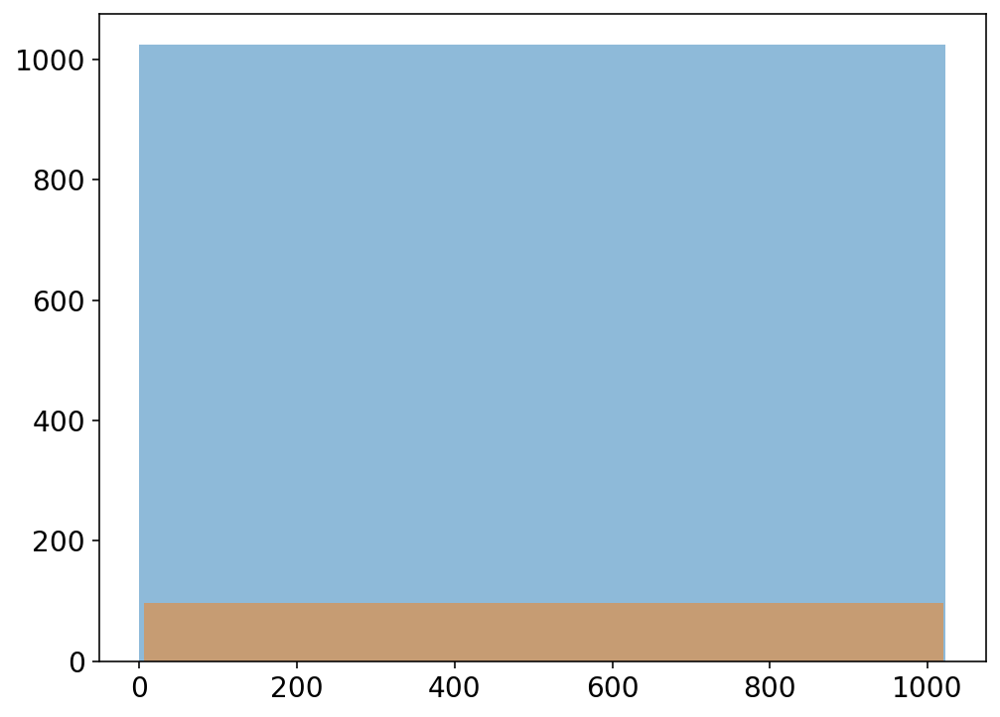

In [72]:
# plt.hist(gen_val_mean_sorted_inds, bins=1, alpha=0.5)
# plt.hist(gen_val_max_highest_inds, bins=1, alpha=0.5)

In [80]:
xvals = np.arange(0, 96, 1)
print(len(xvals))

96


In [82]:
# print(len(gen_val_mean_highest_inds))

96


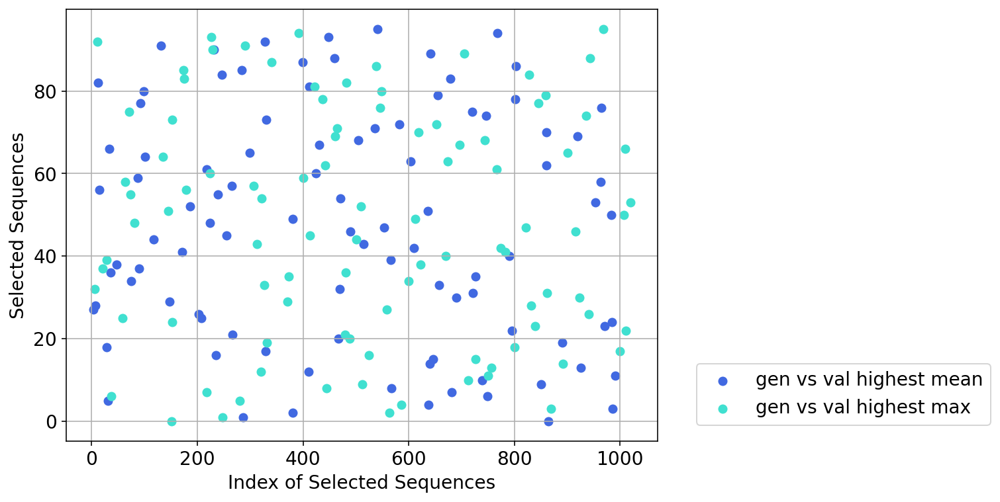

In [103]:
plt.scatter(gen_val_mean_highest_inds, xvals, color="royalblue", label="gen vs val highest mean")
plt.scatter(gen_val_max_highest_inds, xvals, color="turquoise", label="gen vs val highest max")
# plt.scatter(xvals, gen_val_mean_highest_inds, color="royalblue", alpha=0.5, label="gen vs val highest mean")
# # plt.scatter(xvals, gen_val_mean_highest_inds, color="royalblue", alpha=0.5, label="gen vs val highest mean")

plt.ylabel("Selected Sequences")
plt.xlabel("Index of Selected Sequences")
plt.legend(bbox_to_anchor =(1.05, 0.2))
plt.grid()

Text(0.5, 0, 'Index of Selected Sequences')

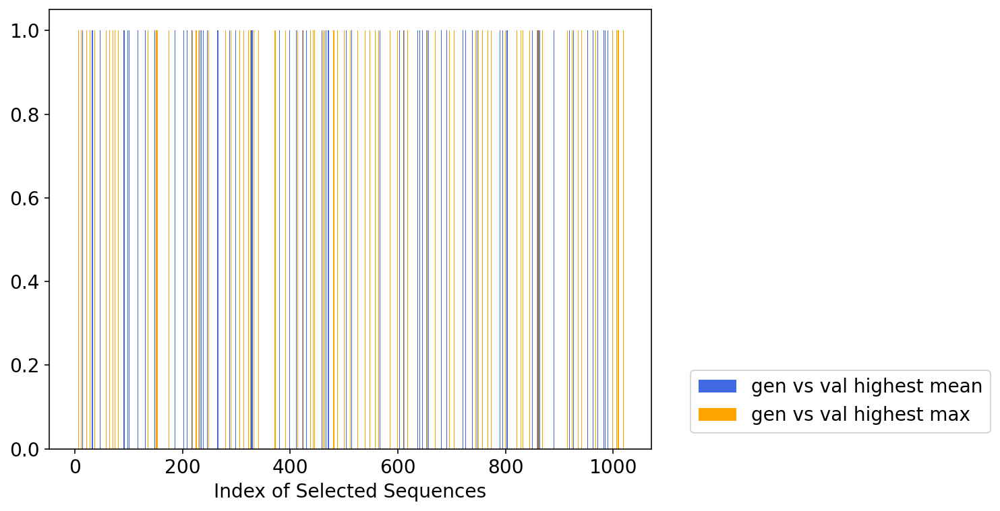

In [111]:
plt.hist(gen_val_mean_highest_inds, bins=1024, color="royalblue", label="gen vs val highest mean")
plt.hist(gen_val_max_highest_inds, bins=1024, color="orange", label="gen vs val highest max")
plt.legend(bbox_to_anchor =(1.05, 0.2))
plt.xlabel("Index of Selected Sequences")

Text(0.5, 0, 'Index of Selected Sequences')

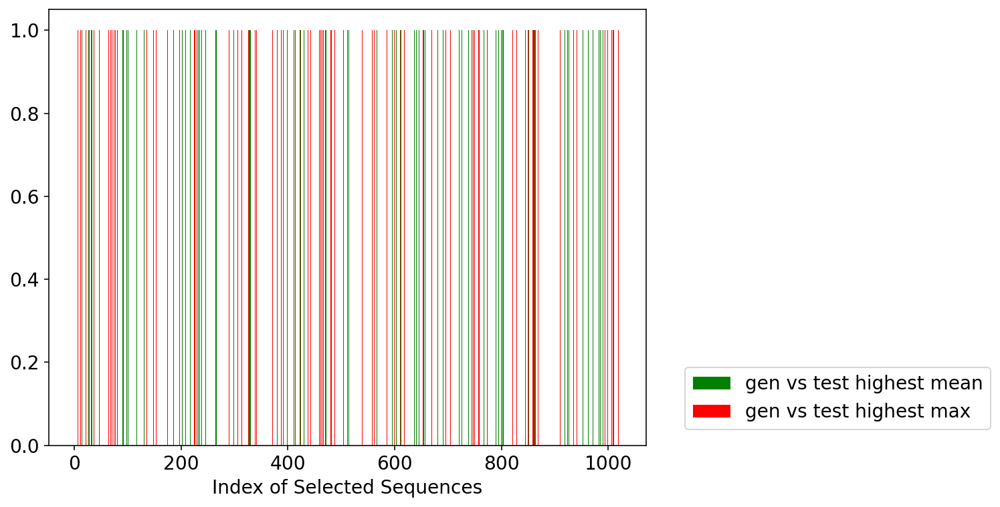

In [114]:
plt.hist(gen_test_mean_highest_inds, bins=1024, color="green", label="gen vs test highest mean")
plt.hist(gen_test_max_highest_inds, bins=1024, color="red", label="gen vs test highest max")
plt.legend(bbox_to_anchor =(1.05, 0.2))
plt.xlabel("Index of Selected Sequences")